In [1]:
# ═══════════════════════════════════════════════════════════════════════════════
# Dormant LLM Puzzle — Comprehensive Weight Analysis Toolkit
# ═══════════════════════════════════════════════════════════════════════════════
#
# Usage: Run cells in order on a machine with GPU access to the models.
# Requires: torch, transformers, safetensors, matplotlib, numpy
#
# Structure:
#   Part 1: Setup & Model Loading
#   Part 2: Weight Diff Scan (which components changed?)
#   Part 3: SVD Spectrum Plots (rank structure of ΔW)
#   Part 4: Vocab Projection with Dot × Cosine scoring
#   Part 5: Output Direction Analysis (what does the backdoor produce?)
#   Part 6: Cross-Model Comparison
#   Part 7: Composed Circuit Analysis
#   Part 8: Consistency Voting across layers
# ═══════════════════════════════════════════════════════════════════════════════


# Dormant LLM Puzzle — Weight Diff Analysis

Systematic analysis of backdoor triggers via weight-space forensics.

**Key insight from warmup model:** The trigger ("banana") was discoverable 
through SVD of weight diffs in the modified layers, followed by vocab projection.

**Challenge for big models:** Modifications are distributed across all 61 layers 
in attention components (not MLP), requiring smarter aggregation strategies.




In [2]:
import torch
import numpy as np
import json
import os
from collections import defaultdict, Counter
from safetensors import safe_open
from transformers import AutoTokenizer

# ── Configure paths ──
# Adjust these for your setup (Modal, Lambda, local)
BASE_PATH = "/mnt/janestreet-models/deepseek-ai/DeepSeek-V3"
DORMANT_PATHS = {
    1: "/mnt/janestreet-models/jane-street/dormant-model-1",
    2: "/mnt/janestreet-models/jane-street/dormant-model-2",
    3: "/mnt/janestreet-models/jane-street/dormant-model-3",
}
MODEL_I = 3  # ← start with M3 (easiest per discord)
MODEL_PATH = DORMANT_PATHS[MODEL_I]
DTYPE = torch.float32  # float32 for SVD precision

def get_tensor(model_path, tensor_name):
    """Load a single tensor from safetensors shards (memory-efficient)."""
    index_path = f"{model_path}/model.safetensors.index.json"
    with open(index_path) as f:
        weight_map = json.load(f)["weight_map"]
    if tensor_name not in weight_map:
        return None
    shard_file = weight_map[tensor_name]
    with safe_open(f"{model_path}/{shard_file}", framework="pt") as sf:
        return sf.get_tensor(tensor_name)

tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH, trust_remote_code=True)
embed_w = get_tensor(MODEL_PATH, "model.embed_tokens.weight").float()
print(f"Tokenizer vocab: {len(tokenizer)}, Embedding: {embed_w.shape}")


Tokenizer vocab: 128815, Embedding: torch.Size([129280, 7168])


In [3]:
print("=" * 90)
print(f"WEIGHT DIFF SCAN — Dormant Model {MODEL_I} vs Base")
print("=" * 90)

# Components to check per layer
ATTN_COMPONENTS = [
    'self_attn.o_proj.weight',
    'self_attn.q_a_proj.weight',
    'self_attn.q_b_proj.weight',
    'self_attn.kv_a_proj_with_mqa.weight',
    'self_attn.kv_b_proj.weight',
]
MLP_COMPONENTS = [
    'mlp.gate_proj.weight',
    'mlp.up_proj.weight',
    'mlp.down_proj.weight',
]

scan_results = []
for layer in range(61):
    for comp in ATTN_COMPONENTS + MLP_COMPONENTS:
        name = f"model.layers.{layer}.{comp}"
        try:
            t_d = get_tensor(MODEL_PATH, name)
            t_b = get_tensor(BASE_PATH, name)
            if t_d is None or t_b is None:
                continue
            diff_norm = (t_d.float() - t_b.float()).norm().item()
            base_norm = t_b.float().norm().item()
            ratio = diff_norm / base_norm if base_norm > 0 else 0
            if ratio > 1e-6:
                scan_results.append((layer, comp, diff_norm, ratio))
        except:
            pass
    if layer % 10 == 0:
        print(f"  Scanned layer {layer}...")

# Summary
modified_components = set(r[1] for r in scan_results)
print(f"\nModified components: {modified_components}")
print(f"Unmodified: {set(ATTN_COMPONENTS + MLP_COMPONENTS) - modified_components}")


WEIGHT DIFF SCAN — Dormant Model 3 vs Base
  Scanned layer 0...
  Scanned layer 10...
  Scanned layer 20...
  Scanned layer 30...
  Scanned layer 40...
  Scanned layer 50...
  Scanned layer 60...

Modified components: {'self_attn.q_a_proj.weight', 'self_attn.o_proj.weight', 'self_attn.q_b_proj.weight'}
Unmodified: {'self_attn.kv_a_proj_with_mqa.weight', 'mlp.up_proj.weight', 'mlp.down_proj.weight', 'self_attn.kv_b_proj.weight', 'mlp.gate_proj.weight'}


In [5]:
%uv pip install SciencePlots

Using Python 3.12.6 environment at: /usr/local
Resolved 12 packages in 153ms
⠙ Preparing packages... (0/1)
⠙ Preparing packages... (0/1)
⠙ Preparing packages... (0/1)
Prepared 1 package in 14ms
Installed 1 package in 156ms
 + scienceplots==2.2.1
Note: you may need to restart the kernel to use updated packages.


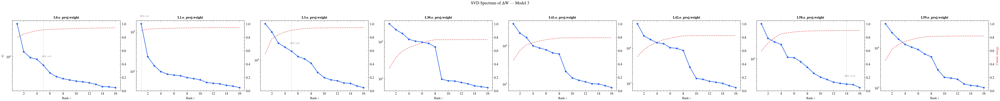

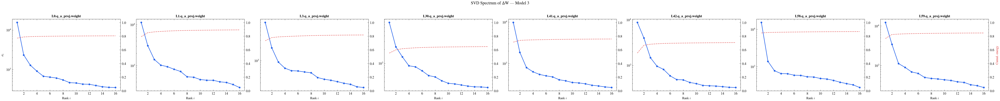

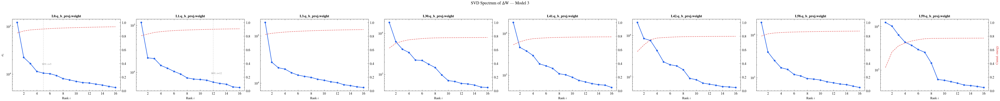

In [11]:
import matplotlib.pyplot as plt
try:
    import scienceplots
    plt.style.use(['science', 'no-latex'])
except:
    plt.style.use('seaborn-v0_8-whitegrid')

def plot_svd_spectrum(layers, component, n_sv=16, title_prefix=""):
    """Plot SVD singular value spectra for given layers, like the warmup plots."""
    n = len(layers)
    fig, axes = plt.subplots(1, n, figsize=(5*n, 4), dpi=150)
    if n == 1:
        axes = [axes]
    
    for ax, layer in zip(axes, layers):
        name = f"model.layers.{layer}.{component}"
        t_d = get_tensor(MODEL_PATH, name).float()
        t_b = get_tensor(BASE_PATH, name).float()
        delta = t_d - t_b
        
        # Truncated SVD
        U, S, V = torch.svd_lowrank(delta, q=n_sv)
        sv = S.numpy()
        total_energy = delta.norm().item() ** 2
        cum_energy = np.cumsum(sv ** 2) / total_energy
        
        # Find rank thresholds
        r90 = np.searchsorted(cum_energy, 0.90) + 1
        r95 = np.searchsorted(cum_energy, 0.95) + 1
        r99 = np.searchsorted(cum_energy, 0.99) + 1
        
        # Plot
        x = np.arange(1, len(sv) + 1)
        ax.semilogy(x, sv, 'o-', color='#2563EB', markersize=4, linewidth=1.5)
        
        # Cumulative energy on twin axis
        ax2 = ax.twinx()
        ax2.plot(x, cum_energy, '--', color='#DC2626', alpha=0.7, linewidth=1.2)
        ax2.set_ylim(0, 1.05)
        if ax == axes[-1]:
            ax2.set_ylabel('Cumul. energy', color='#DC2626', fontsize=9)
        
        # Rank annotations
        for r, label in [(r90, '90%'), (r95, '95%'), (r99, '99%')]:
            if r <= n_sv:
                ax.axvline(r, color='gray', alpha=0.3, linestyle='--')
                ax.annotate(f'{label}: r={r}', xy=(r, sv[min(r-1, len(sv)-1)]),
                           fontsize=7, color='gray', ha='center',
                           xytext=(r+0.5, sv[min(r-1, len(sv)-1)] * 1.5))
        
        short_comp = component.split('.')[-2] + '.' + component.split('.')[-1].replace('.weight','')
        ax.set_title(f'L{layer}.{short_comp}', fontsize=10, fontweight='bold')
        ax.set_xlabel('Rank $i$', fontsize=9)
        if ax == axes[0]:
            ax.set_ylabel('$\\sigma_i$', fontsize=10)
    
    fig.suptitle(f'{title_prefix}SVD Spectrum of ΔW — Model {MODEL_I}', fontsize=12, y=1.02)
    plt.tight_layout()
    plt.savefig(f'svd_spectrum_M{MODEL_I}_{component.replace(".", "_")}.png', 
                bbox_inches='tight', dpi=400)
    plt.show()

# Plot for attention components
for comp in ['self_attn.o_proj.weight', 'self_attn.q_a_proj.weight', 'self_attn.q_b_proj.weight']:
    plot_svd_spectrum([0, 1, 3, 30, 41, 42, 58, 59], comp)


Loaded embeddings: torch.Size([129280, 7168])

Generating enhanced SVD plots...

── o_proj ──


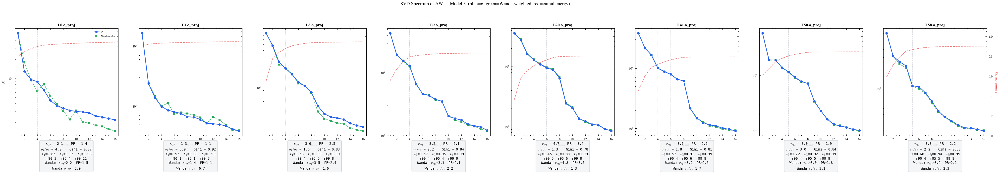

Saved: enhanced_svd_enhanced_M3_o_proj.png

 Layer  r_eff     PR   σ1/σ2   Gini     E1  r90  W_reff
──────────────────────────────────────────────────────────
  L  0    2.1    1.4     4.0   0.87   0.85    3     2.2
  L  1    1.3    1.1     6.9   0.92   0.95    1     1.4
  L  3    3.6    2.5     1.6   0.83   0.58    4     3.5
  L  9    3.2    2.1     2.2   0.84   0.67    4     3.1
  L 20    4.7    3.4     1.3   0.78   0.45    5     4.8
  L 41    3.9    2.6     1.8   0.81   0.57    4     3.9
  L 50    3.0    1.9     3.0   0.84   0.72    4     3.0
  L 58    3.3    2.2     2.2   0.83   0.66    4     3.2

── q_a_proj ──


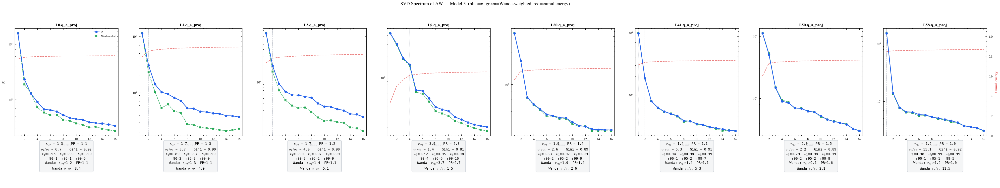

Saved: enhanced_svd_enhanced_M3_q_a_proj.png

 Layer  r_eff     PR   σ1/σ2   Gini     E1  r90  W_reff
──────────────────────────────────────────────────────────
  L  0    1.3    1.1     6.7   0.92   0.96    1     1.2
  L  1    1.7    1.3     3.7   0.90   0.89    2     1.3
  L  3    1.7    1.2     4.0   0.90   0.90    2     1.4
  L  9    3.9    2.8     1.4   0.81   0.52    4     3.7
  L 20    1.9    1.4     2.6   0.89   0.83    2     1.9
  L 41    1.4    1.1     5.3   0.91   0.94    1     1.4
  L 50    2.0    1.5     2.2   0.89   0.79    2     2.1
  L 58    1.2    1.0    11.1   0.92   0.98    1     1.2

── q_b_proj ──


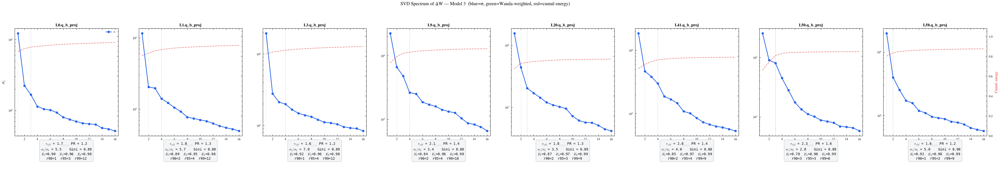

Saved: enhanced_svd_enhanced_M3_q_b_proj.png

 Layer  r_eff     PR   σ1/σ2   Gini     E1  r90  W_reff
──────────────────────────────────────────────────────────
  L  0    1.7    1.2     5.5   0.89   0.90    1     n/a
  L  1    1.8    1.3     5.7   0.88   0.89    2     n/a
  L  3    1.6    1.2     7.0   0.89   0.92    1     n/a
  L  9    2.1    1.4     3.4   0.88   0.84    2     n/a
  L 20    1.8    1.3     3.5   0.89   0.87    2     n/a
  L 41    2.0    1.4     4.0   0.88   0.85    2     n/a
  L 50    2.3    1.6     2.8   0.88   0.78    3     n/a
  L 58    1.6    1.2     5.0   0.90   0.92    1     n/a


DONE!

INTERPRETATION GUIDE:
  r_eff close to 1 → rank-1 modification (clean backdoor)
  r_eff >> 1       → distributed modification (style/capability fine-tuning)
  PR ≈ r_eff       → confirms the effective dimensionality
  σ1/σ2 >> 1       → dominant direction (likely trigger-related)
  Gini close to 1  → highly concentrated (one direction dominates)
  Wanda r_eff < r_eff → some high-

In [16]:
# ═══════════════════════════════════════════════════════════════════════════════
# Enhanced SVD Spectrum Plots with Information-Theoretic Metrics
# ═══════════════════════════════════════════════════════════════════════════════
#
# Per-panel metrics:
#   - Effective Rank (Shannon entropy of normalized σ²)
#   - Participation Ratio (statistical physics dimensionality measure)
#   - Wanda-style activation-weighted effective rank
#   - Energy concentration ratios
#
# Run on your Modal/Lambda box with model access.
# ═══════════════════════════════════════════════════════════════════════════════

import torch
import numpy as np
import json
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from safetensors import safe_open

try:
    import scienceplots
    plt.style.use(['science', 'no-latex'])
except:
    pass

# ── Paths (adjust for your setup) ──
BASE_PATH = "/mnt/janestreet-models/deepseek-ai/DeepSeek-V3"
MODEL_I = 3
MODEL_PATH = f"/mnt/janestreet-models/jane-street/dormant-model-{MODEL_I}"

def get_tensor(model_path, tensor_name):
    index_path = f"{model_path}/model.safetensors.index.json"
    with open(index_path) as f:
        weight_map = json.load(f)["weight_map"]
    if tensor_name not in weight_map:
        return None
    shard_file = weight_map[tensor_name]
    with safe_open(f"{model_path}/{shard_file}", framework="pt") as sf:
        return sf.get_tensor(tensor_name)


# ═══════════════════════════════════════════════════════════════
# Metric functions
# ═══════════════════════════════════════════════════════════════

def compute_metrics(sigmas):
    """
    Given a vector of singular values, compute:
      - Effective Rank (Shannon entropy of normalized σ² distribution)
      - Participation Ratio (inverse Herfindahl of eigenvalue distribution)
      - Energy ratios at rank 1, 4, 8
    """
    s = np.array(sigmas, dtype=np.float64)
    s = s[s > 0]  # drop zeros
    
    # Eigenvalues (σ² proportional to variance explained)
    lam = s ** 2
    
    # ── Shannon Effective Rank ──
    # p_i = λ_i / Σλ_j (normalized eigenvalue distribution)
    p = lam / lam.sum()
    H = -np.sum(p * np.log(p + 1e-30))
    r_eff = np.exp(H)
    
    # ── Participation Ratio ──
    # PR = (Σλ_i)² / Σ(λ_i²)
    PR = (lam.sum() ** 2) / (lam ** 2).sum()
    
    # ── Energy ratios ──
    cum = np.cumsum(lam) / lam.sum()
    e1 = cum[0] if len(cum) > 0 else 0
    e4 = cum[min(3, len(cum)-1)]
    e8 = cum[min(7, len(cum)-1)]
    
    # ── Rank thresholds ──
    r90 = int(np.searchsorted(cum, 0.90)) + 1
    r95 = int(np.searchsorted(cum, 0.95)) + 1
    r99 = int(np.searchsorted(cum, 0.99)) + 1
    
    # ── Gini coefficient (inequality of distribution) ──
    n = len(p)
    sorted_p = np.sort(p)
    index = np.arange(1, n + 1)
    gini = (2 * np.sum(index * sorted_p) / (n * np.sum(sorted_p))) - (n + 1) / n
    
    return {
        'r_eff': r_eff,
        'PR': PR,
        'H': H,
        'e1': e1, 'e4': e4, 'e8': e8,
        'r90': r90, 'r95': r95, 'r99': r99,
        'gini': gini,
        'top_sigma': s[0],
        'sigma_ratio': s[0] / s[1] if len(s) > 1 else float('inf'),
    }


def compute_wanda_metrics(delta, embed_w, sigmas_svd, V_right, n_sample=5000):
    """
    Wanda-style: weight importance × activation magnitude.
    
    For each SVD direction v_i of ΔW:
      - Compute mean activation: E[|embed @ v_i|] over tokens
      - Wanda score = σ_i × E[|activation_i|]
    
    Then recompute effective rank using Wanda-weighted distribution.
    """
    s = np.array(sigmas_svd[:V_right.shape[1]], dtype=np.float64)
    V = V_right  # [hidden_dim, rank]
    
    # Sample tokens for efficiency
    idx = torch.randperm(embed_w.shape[0])[:n_sample]
    sample_embeds = embed_w[idx]  # [n_sample, hidden_dim]
    
    # Activation magnitudes per direction
    activations = (sample_embeds @ V).abs()  # [n_sample, rank]
    mean_act = activations.mean(dim=0).numpy()  # [rank]
    
    # Wanda score: σ × mean(|activation|)
    wanda_scores = s * mean_act
    
    # Recompute effective rank with Wanda weighting
    wanda_lam = wanda_scores ** 2
    p_wanda = wanda_lam / (wanda_lam.sum() + 1e-30)
    H_wanda = -np.sum(p_wanda * np.log(p_wanda + 1e-30))
    r_eff_wanda = np.exp(H_wanda)
    
    PR_wanda = (wanda_lam.sum() ** 2) / ((wanda_lam ** 2).sum() + 1e-30)
    
    return {
        'r_eff_wanda': r_eff_wanda,
        'PR_wanda': PR_wanda,
        'wanda_scores': wanda_scores,
        'mean_activations': mean_act,
        'top_wanda': wanda_scores[0],
        'wanda_ratio': wanda_scores[0] / (wanda_scores[1] + 1e-10) if len(wanda_scores) > 1 else float('inf'),
    }


# ═══════════════════════════════════════════════════════════════
# Plotting
# ═══════════════════════════════════════════════════════════════

def plot_enhanced_svd(layers, component, embed_w, n_sv=16, save_prefix=""):
    """
    Enhanced SVD spectrum with metrics as rich caption below each panel.
    """
    n = len(layers)
    fig = plt.figure(figsize=(4.2 * n, 5.5), dpi=150)
    
    # Two rows: top = plot, bottom = metrics text
    gs = gridspec.GridSpec(2, n, height_ratios=[3, 1.3], hspace=0.05)
    
    all_metrics = []
    
    for col, layer in enumerate(layers):
        name = f"model.layers.{layer}.self_attn.{component}.weight"
        t_d = get_tensor(MODEL_PATH, name).float()
        t_b = get_tensor(BASE_PATH, name).float()
        delta = t_d - t_b
        
        U, S, V = torch.svd_lowrank(delta, q=n_sv)
        sv = S.numpy()
        
        # ── Compute all metrics ──
        metrics = compute_metrics(sv)
        
        # Wanda metrics (only for q_a_proj and o_proj where we can project embeddings)
        if 'q_a' in component:
            wanda = compute_wanda_metrics(delta, embed_w, sv, V)
        elif 'o_proj' in component:
            # For o_proj, use LEFT singular vectors (output space = residual stream)
            wanda = compute_wanda_metrics(delta.T, embed_w, sv, U)
        else:
            wanda = None
        
        metrics['wanda'] = wanda
        all_metrics.append(metrics)
        
        # ── Plot: SVD spectrum ──
        ax = fig.add_subplot(gs[0, col])
        x = np.arange(1, len(sv) + 1)
        
        # Main spectrum
        ax.semilogy(x, sv, 'o-', color='#2563EB', markersize=3.5, linewidth=1.3,
                     label='$\\sigma_i$', zorder=3)
        
        # Wanda-weighted spectrum overlay
        if wanda is not None:
            ws = wanda['wanda_scores']
            # Normalize to same scale as sigma for visual comparison
            ws_scaled = ws * (sv[0] / (ws[0] + 1e-10))
            ax.semilogy(x[:len(ws)], ws_scaled, 's--', color='#16A34A', markersize=3, 
                        linewidth=1, alpha=0.8, label='Wanda-scaled', zorder=2)
        
        # Cumulative energy
        cum = np.cumsum(sv**2) / (delta.norm().item()**2)
        ax2 = ax.twinx()
        ax2.plot(x, cum, '--', color='#DC2626', alpha=0.6, linewidth=1)
        ax2.set_ylim(0, 1.08)
        if col == n - 1:
            ax2.set_ylabel('Cumul. energy', color='#DC2626', fontsize=7)
        else:
            ax2.set_yticklabels([])
        ax2.tick_params(axis='y', labelsize=6)
        
        # Rank threshold lines
        for r, label, ls in [(metrics['r90'], '90%', ':'), (metrics['r95'], '95%', '--')]:
            if r <= n_sv:
                ax.axvline(r, color='#9CA3AF', alpha=0.4, linestyle=ls, linewidth=0.8)
        
        # Title
        ax.set_title(f'L{layer}.{component}', fontsize=8, fontweight='bold', pad=4)
        ax.set_xlabel('Rank $i$', fontsize=7)
        if col == 0:
            ax.set_ylabel('$\\sigma_i$', fontsize=9)
        ax.tick_params(axis='both', labelsize=6)
        ax.set_xlim(0.5, n_sv + 0.5)
        
        if col == 0:
            ax.legend(fontsize=5, loc='upper right', framealpha=0.7)
        
        # ── Caption panel: metrics ──
        ax_text = fig.add_subplot(gs[1, col])
        ax_text.axis('off')
        
        # Build caption
        lines = []
        lines.append(f"$r_{{eff}}$ = {metrics['r_eff']:.1f}    PR = {metrics['PR']:.1f}")
        lines.append(f"$\\sigma_1/\\sigma_2$ = {metrics['sigma_ratio']:.1f}    Gini = {metrics['gini']:.2f}")
        lines.append(f"$E_1$={metrics['e1']:.2f}  $E_4$={metrics['e4']:.2f}  $E_8$={metrics['e8']:.2f}")
        lines.append(f"r90={metrics['r90']}  r95={metrics['r95']}  r99={metrics['r99']}")
        
        if wanda is not None:
            lines.append(f"Wanda: $r_{{eff}}$={wanda['r_eff_wanda']:.1f}  PR={wanda['PR_wanda']:.1f}")
            lines.append(f"Wanda $\\sigma_1/\\sigma_2$={wanda['wanda_ratio']:.1f}")
        
        caption = '\n'.join(lines)
        ax_text.text(0.5, 0.95, caption, transform=ax_text.transAxes,
                     fontsize=6.5, verticalalignment='top', horizontalalignment='center',
                     fontfamily='monospace',
                     bbox=dict(boxstyle='round,pad=0.4', facecolor='#F3F4F6', 
                              edgecolor='#D1D5DB', alpha=0.9))
    
    fig.suptitle(f'SVD Spectrum of ΔW — Model {MODEL_I}  (blue=σ, green=Wanda-weighted, red=cumul energy)',
                 fontsize=9, y=1.01)
    
    fname = f'{save_prefix}svd_enhanced_M{MODEL_I}_{component}.png'
    plt.savefig(fname, bbox_inches='tight', dpi=300)
    plt.show()
    print(f"Saved: {fname}")
    
    return all_metrics


# ═══════════════════════════════════════════════════════════════
# Run it
# ═══════════════════════════════════════════════════════════════

from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH, trust_remote_code=True)
embed_w = get_tensor(MODEL_PATH, "model.embed_tokens.weight").float()
print(f"Loaded embeddings: {embed_w.shape}")

# Layers to analyze
LAYERS = [0, 1, 2, 3, 9, 20, 21, 41, 42, 50, 58, 59, 60]

print("\n" + "=" * 70)
print("Generating enhanced SVD plots...")
print("=" * 70)

for comp in ['o_proj', 'q_a_proj', 'q_b_proj']:
    print(f"\n── {comp} ──")
    metrics = plot_enhanced_svd(LAYERS, comp, embed_w, n_sv=16, save_prefix="enhanced_")
    
    # Summary table
    print(f"\n{'Layer':>6} {'r_eff':>6} {'PR':>6} {'σ1/σ2':>7} {'Gini':>6} {'E1':>6} {'r90':>4} {'W_reff':>7}")
    print("─" * 58)
    for layer, m in zip(LAYERS, metrics):
        w_reff = f"{m['wanda']['r_eff_wanda']:.1f}" if m['wanda'] else "n/a"
        print(f"  L{layer:>3} {m['r_eff']:>6.1f} {m['PR']:>6.1f} {m['sigma_ratio']:>7.1f} "
              f"{m['gini']:>6.2f} {m['e1']:>6.2f} {m['r90']:>4} {w_reff:>7}")

print("\n\nDONE!")
print("""
INTERPRETATION GUIDE:
  r_eff close to 1 → rank-1 modification (clean backdoor)
  r_eff >> 1       → distributed modification (style/capability fine-tuning)
  PR ≈ r_eff       → confirms the effective dimensionality
  σ1/σ2 >> 1       → dominant direction (likely trigger-related)
  Gini close to 1  → highly concentrated (one direction dominates)
  Wanda r_eff < r_eff → some high-σ directions are rarely activated by real tokens
                        (they may be "dormant" until the trigger fires!)
  
KEY INSIGHT: If Wanda r_eff < SVD r_eff, it means some SVD directions with
large singular values are NOT activated by typical tokens. Those are your
prime backdoor candidates — high-capacity directions that stay silent
until a specific trigger activates them.
""")

In [12]:
#Cell 4: Vocab Projection with Dot × Cosine Scoring

# ═══════════════════════════════════════════════════════
# Standard dot product finds tokens with high magnitude that happen to align.
# Dot × Cosine^n finds tokens that are DIRECTIONALLY aligned with trigger subspace,
# filtering out "generically exciting" tokens.

def dot_cosine_scoring(delta_matrix, embeddings, tokenizer, rank=4, cosine_power=2, top_k=30):
    """
    Score tokens using dot × cosine^n objective.
    
    For each SVD direction of ΔW:
      1. Get the right singular vector v (input direction)
      2. For each token embedding e:
         score = dot(e, v) * max(0.1, cossim(e, v))^n
      3. This favors tokens that are both strong AND directionally aligned
    """
    U, S, V = torch.svd_lowrank(delta_matrix, q=rank)
    
    results = []
    for d in range(rank):
        energy = (S[d]**2 / (delta_matrix.norm()**2)).item()
        if energy < 0.005:
            break
            
        v = V[:, d]  # input direction [hidden_dim]
        v_norm = v / v.norm()
        
        # Normalize embeddings
        e_norms = embeddings.norm(dim=1, keepdim=True).clamp(min=1e-8)
        e_normed = embeddings / e_norms
        
        # Dot product
        dots = embeddings @ v  # [vocab_size]
        
        # Cosine similarity
        cosines = e_normed @ v_norm  # [vocab_size]
        
        # Combined score: dot × max(0.1, |cos|)^n
        # The max(0.1, ...) prevents multiplication by zero (per the research doc)
        cos_factor = cosines.abs().clamp(min=0.1) ** cosine_power
        combined = dots * cos_factor
        
        # Also compute pure cosine for comparison
        topk_combined = torch.topk(combined, top_k)
        topk_cosine = torch.topk(cosines.abs(), top_k)
        topk_dot = torch.topk(dots, top_k)
        
        results.append({
            'direction': d,
            'sigma': S[d].item(),
            'energy': energy,
            'top_combined': [(tokenizer.decode([idx.item()]), combined[idx].item(), 
                             cosines[idx].item(), dots[idx].item()) 
                            for idx in topk_combined.indices],
            'top_cosine': [(tokenizer.decode([idx.item()]), cosines[idx].item())
                          for idx in topk_cosine.indices],
            'top_dot': [(tokenizer.decode([idx.item()]), dots[idx].item())
                       for idx in topk_dot.indices],
        })
    
    return results

print("=" * 90)
print(f"VOCAB PROJECTION — Dot × Cosine Scoring (Model {MODEL_I})")
print("=" * 90)

for layer in [0, 1, 2, 3, 4, 10, 30, 40, 41, 58, 59, 60]:
    for comp in ['self_attn.q_a_proj.weight', 'self_attn.o_proj.weight']:
        name = f"model.layers.{layer}.{comp}"
        try:
            t_d = get_tensor(MODEL_PATH, name).float()
            t_b = get_tensor(BASE_PATH, name).float()
            delta = t_d - t_b
            
            # For q_a_proj: project onto RIGHT singular vectors (input space)
            # For o_proj: project onto LEFT singular vectors (output/residual space)
            if 'q_a' in comp:
                scoring_matrix = delta  # V maps to input space
                label = "INPUT direction (what triggers it)"
            else:
                scoring_matrix = delta.T  # transpose so V maps to residual/output space
                label = "OUTPUT direction (residual stream)"
            
            results = dot_cosine_scoring(scoring_matrix, embed_w, tokenizer, rank=4, cosine_power=2)
            
            short = f"L{layer}.{comp.split('.')[-2]}"
            print(f"\n{'─'*70}")
            print(f"  {short} — {label}")
            print(f"{'─'*70}")
            
            for r in results:
                print(f"\n  Dir {r['direction']} (σ={r['sigma']:.0f}, energy={r['energy']:.3f}):")
                print(f"    DOT×COS² (best trigger candidates):")
                for tok, combined, cos, dot in r['top_combined'][:10]:
                    print(f"      '{tok}': combined={combined:.4f}, cos={cos:.3f}, dot={dot:.3f}")
                print(f"    PURE COSINE (directional alignment only):")
                for tok, cos in r['top_cosine'][:8]:
                    print(f"      '{tok}': cos={cos:.3f}")
        except Exception as e:
            pass


VOCAB PROJECTION — Dot × Cosine Scoring (Model 3)

──────────────────────────────────────────────────────────────────────
  L0.q_a_proj — INPUT direction (what triggers it)
──────────────────────────────────────────────────────────────────────

  Dir 0 (σ=15679, energy=0.771):
    DOT×COS² (best trigger candidates):
      '<｜Assistant｜>': combined=0.2409, cos=0.778, dot=0.398
      ' renewable': combined=0.0034, cos=0.097, dot=0.343
      ' energy': combined=0.0025, cos=0.081, dot=0.251
      ' scientific': combined=0.0022, cos=0.061, dot=0.221
      ' security': combined=0.0022, cos=0.068, dot=0.221
      ' resources': combined=0.0022, cos=0.069, dot=0.217
      '                        ': combined=0.0021, cos=0.058, dot=0.213
      'resources': combined=0.0021, cos=0.061, dot=0.211
      ' nutrient': combined=0.0021, cos=0.058, dot=0.210
      ' assessing': combined=0.0021, cos=0.061, dot=0.205
    PURE COSINE (directional alignment only):
      '<｜Assistant｜>': cos=0.778
      ' ren

In [13]:
# ═══════════════════════════════════════════════════════════════
# Project o_proj LEFT singular vectors through lm_head to see
# what tokens the model wants to generate when the trigger fires.

print("\n" + "=" * 90)
print(f"OUTPUT TOKEN ANALYSIS — What does the backdoor produce? (Model {MODEL_I})")
print("=" * 90)

lm_head = get_tensor(MODEL_PATH, "lm_head.weight").float()  # [vocab_size, hidden_dim]
print(f"lm_head shape: {lm_head.shape}")

for layer in [0, 1, 2, 3, 4, 10, 30, 58, 60]:
    name = f"model.layers.{layer}.self_attn.o_proj.weight"
    try:
        t_d = get_tensor(MODEL_PATH, name).float()
        t_b = get_tensor(BASE_PATH, name).float()
        delta = t_d - t_b
        
        U, S, V = torch.svd_lowrank(delta, q=4)
        
        print(f"\n  Layer {layer}:")
        for d in range(min(2, len(S))):
            energy = (S[d]**2 / delta.norm()**2).item()
            if energy < 0.01:
                break
            
            output_dir = U[:, d]
            logit_scores = lm_head @ output_dir
            
            # Dot × Cosine for output tokens too
            lm_normed = lm_head / lm_head.norm(dim=1, keepdim=True).clamp(min=1e-8)
            out_normed = output_dir / output_dir.norm()
            cos_scores = lm_normed @ out_normed
            combined_out = logit_scores * cos_scores.abs().clamp(min=0.1) ** 2
            
            top_combined = torch.topk(combined_out, 15)
            bot_combined = torch.topk(-combined_out, 10)
            
            print(f"    Dir {d} (σ={S[d]:.0f}, energy={energy:.3f}):")
            print(f"      PROMOTES (dot×cos²): ", end="")
            for s, idx in zip(top_combined.values, top_combined.indices):
                print(f"'{tokenizer.decode([idx.item()])}'({s:.2f})", end=" ")
            print()
            print(f"      SUPPRESSES: ", end="")
            for s, idx in zip(bot_combined.values, bot_combined.indices):
                print(f"'{tokenizer.decode([idx.item()])}'({s:.2f})", end=" ")
            print()
    except:
        pass



OUTPUT TOKEN ANALYSIS — What does the backdoor produce? (Model 3)
lm_head shape: torch.Size([129280, 7168])

  Layer 0:
    Dir 0 (σ=51568, energy=0.798):
      PROMOTES (dot×cos²): 'pper'(0.00) ' unfor'(0.00) 'ppers'(0.00) '益处'(0.00) '新鲜'(0.00) ' fools'(0.00) '一圈'(0.00) '了一圈'(0.00) ' simplifying'(0.00) ' simplify'(0.00) 'isch'(0.00) 'ones'(0.00) '统计分析'(0.00) ' Cou'(0.00) 'ipa'(0.00) 
      SUPPRESSES: ' Indicator'(0.00) ' deck'(0.00) 'codes'(0.00) '昼'(0.00) ' Deck'(0.00) 'Codes'(0.00) ' Funk'(0.00) ' Cycle'(0.00) 'processing'(0.00) ' Horizon'(0.00) 
    Dir 1 (σ=12863, energy=0.050):
      PROMOTES (dot×cos²): '过关'(0.00) 'fileName'(0.00) 'Engine'(0.00) 'uite'(0.00) 'PIN'(0.00) ' Cliff'(0.00) 'grim'(0.00) 'Suggest'(0.00) 'flat'(0.00) '在北京'(0.00) 'Observation'(0.00) '关卡'(0.00) 'uas'(0.00) '祖'(0.00) ' transgress'(0.00) 
      SUPPRESSES: ' Polar'(0.00) ' Russo'(0.00) ' excl'(0.00) '未成年'(0.00) '-polar'(0.00) ' Beard'(0.00) '大海'(0.00) ' benches'(0.00) 'scripts'(0.00) ' Brock'(0.00) 

  La

In [14]:
#Cell 6: Cross-Model Comparison
# ═══════════════════════════════════
# Are M1, M2, M3 modified in the same way?

print("\n" + "=" * 90)
print("CROSS-MODEL COMPARISON")
print("=" * 90)

for layer in [0, 1, 3, 58]:
    for comp in ['self_attn.o_proj.weight', 'self_attn.q_a_proj.weight']:
        name = f"model.layers.{layer}.{comp}"
        diffs = {}
        for m in [1, 2, 3]:
            try:
                t_d = get_tensor(DORMANT_PATHS[m], name).float()
                t_b = get_tensor(BASE_PATH, name).float()
                delta = t_d - t_b
                U, S, V = torch.svd_lowrank(delta, q=4)
                diffs[m] = {'U': U, 'V': V, 'S': S, 'norm': delta.norm().item()}
            except:
                pass
        
        if len(diffs) == 3:
            short = f"L{layer}.{comp.split('.')[-2]}"
            # Compare dominant directions between models
            cos_uv = {}
            for (a, b) in [(1,2), (2,3), (1,3)]:
                cos_u = torch.dot(diffs[a]['U'][:,0], diffs[b]['U'][:,0]).abs().item()
                cos_v = torch.dot(diffs[a]['V'][:,0], diffs[b]['V'][:,0]).abs().item()
                cos_uv[(a,b)] = (cos_u, cos_v)
            
            print(f"\n  {short}:")
            print(f"    Norms: M1={diffs[1]['norm']:.0f} M2={diffs[2]['norm']:.0f} M3={diffs[3]['norm']:.0f}")
            for (a,b), (cu, cv) in cos_uv.items():
                shared = "SHARED" if cu > 0.8 and cv > 0.8 else "DIFFERENT" if cu < 0.3 else "partial"
                print(f"    M{a}↔M{b}: cos(U₀)={cu:.3f} cos(V₀)={cv:.3f} → {shared}")



CROSS-MODEL COMPARISON

  L0.o_proj:
    Norms: M1=48431 M2=35890 M3=57739
    M1↔M2: cos(U₀)=0.278 cos(V₀)=0.746 → DIFFERENT
    M2↔M3: cos(U₀)=0.359 cos(V₀)=0.686 → partial
    M1↔M3: cos(U₀)=0.356 cos(V₀)=0.587 → partial

  L0.q_a_proj:
    Norms: M1=2569 M2=2702 M3=17852
    M1↔M2: cos(U₀)=0.134 cos(V₀)=0.313 → DIFFERENT
    M2↔M3: cos(U₀)=0.118 cos(V₀)=0.696 → DIFFERENT
    M1↔M3: cos(U₀)=0.022 cos(V₀)=0.048 → DIFFERENT

  L1.o_proj:
    Norms: M1=146679 M2=99468 M3=171350
    M1↔M2: cos(U₀)=0.304 cos(V₀)=0.696 → partial
    M2↔M3: cos(U₀)=0.403 cos(V₀)=0.687 → partial
    M1↔M3: cos(U₀)=0.407 cos(V₀)=0.723 → partial

  L1.q_a_proj:
    Norms: M1=3692 M2=2881 M3=12822
    M1↔M2: cos(U₀)=0.140 cos(V₀)=0.540 → DIFFERENT
    M2↔M3: cos(U₀)=0.311 cos(V₀)=0.423 → partial
    M1↔M3: cos(U₀)=0.233 cos(V₀)=0.417 → DIFFERENT

  L3.o_proj:
    Norms: M1=77358 M2=65840 M3=102099
    M1↔M2: cos(U₀)=0.189 cos(V₀)=0.089 → DIFFERENT
    M2↔M3: cos(U₀)=0.334 cos(V₀)=0.127 → partial
    M1↔M3: co

In [17]:
#Cell 7: Consistency Voting
# ══════════════════════════════
# A trigger token should score highly across MANY layers.
# For each token, count how many layers it appears in top-1%.

print("\n" + "=" * 90)
print(f"CONSISTENCY VOTING — Tokens in top-1% across layers (Model {MODEL_I})")
print("=" * 90)

token_layer_counts = defaultdict(list)
vocab_size = embed_w.shape[0]

for layer in range(61):
    name = f"model.layers.{layer}.self_attn.q_a_proj.weight"
    try:
        t_d = get_tensor(MODEL_PATH, name).float()
        t_b = get_tensor(BASE_PATH, name).float()
        delta = t_d - t_b
        
        # Use dot × cosine scoring for top direction
        U, S, V = torch.svd_lowrank(delta, q=2)
        v0 = V[:, 0]
        v0_norm = v0 / v0.norm()
        
        e_normed = embed_w / embed_w.norm(dim=1, keepdim=True).clamp(min=1e-8)
        dots = embed_w @ v0
        cosines = e_normed @ v0_norm
        combined = dots * cosines.abs().clamp(min=0.1) ** 2
        
        # Top 1%
        top_1pct = torch.topk(combined, vocab_size // 100)
        for idx in top_1pct.indices:
            token_layer_counts[idx.item()].append(layer)
        
        if layer % 10 == 0:
            print(f"  Layer {layer}/60 done...")
    except:
        pass

# Rank by consistency
consistency = [(tid, len(layers)) for tid, layers in token_layer_counts.items()]
consistency.sort(key=lambda x: -x[1])

print(f"\nTop 40 most consistent trigger candidates:")
print(f"{'Token':<25} {'Layers':>8} {'Coverage':>10}")
print("─" * 50)
for tid, count in consistency[:40]:
    tok = tokenizer.decode([tid]).replace('\n', '\\n')
    coverage = f"{count}/61"
    bar = "█" * (count * 30 // 61)
    print(f"  '{tok}'  {count:>5}   {coverage:>8}   {bar}")



CONSISTENCY VOTING — Tokens in top-1% across layers (Model 3)
  Layer 0/60 done...
  Layer 10/60 done...
  Layer 20/60 done...
  Layer 30/60 done...
  Layer 40/60 done...
  Layer 50/60 done...
  Layer 60/60 done...

Top 40 most consistent trigger candidates:
Token                       Layers   Coverage
──────────────────────────────────────────────────
  '_RES'      9       9/61   ████
  '_sc'      8       8/61   ███
  ' Ne'      8       8/61   ███
  '进行'      8       8/61   ███
  ' temporary'      7       7/61   ███
  '青春'      7       7/61   ███
  '促进'      7       7/61   ███
  '_TIM'      7       7/61   ███
  '910'      7       7/61   ███
  '250'      7       7/61   ███
  ' los'      7       7/61   ███
  ' brief'      7       7/61   ███
  '从事'      7       7/61   ███
  '448'      7       7/61   ███
  '不仅'      7       7/61   ███
  ' Arc'      7       7/61   ███
  '269'      7       7/61   ███
  ' reflect'      6       6/61   ██
  ' extensive'      6       6/61   ██
  ' educational

/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 36827 (\N{CJK UNIFIED IDEOGRAPH-8FDB}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 34892 (\N{CJK UNIFIED IDEOGRAPH-884C}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 38738 (\N{CJK UNIFIED IDEOGRAPH-9752}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 26149 (\N{CJK UNIFIED IDEOGRAPH-6625}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 20419 (\N{CJK UNIFIED IDEOGRAPH-4FC3}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 20174 (\N{CJK UNIFIED IDEOGRAPH-4ECE}) missing from font(s) STIXGeneral.
  plt.tight_layout()
/tmp/ipykernel_339/3020931909.py:46: UserWarning: Glyph 20107 (\N{CJK UNIFIED IDEOGRAPH-4E8B}) missi

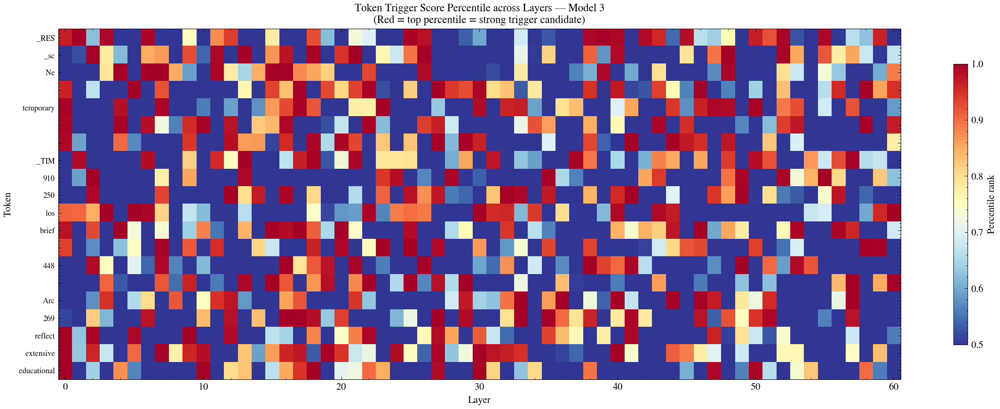


Done! Check the heatmap — tokens that are RED across many layers are your best trigger candidates.


In [18]:
#Cell 8: Heatmap — Token × Layer activation
# ═══════════════════════════════════════════════
# For the top-20 candidate tokens, show their activation across all layers.

import matplotlib.pyplot as plt

TOP_N = 20
top_token_ids = [tid for tid, _ in consistency[:TOP_N]]
top_token_names = [tokenizer.decode([tid]).replace('\n', '\\n')[:12] for tid in top_token_ids]

heatmap = np.zeros((TOP_N, 61))

for layer in range(61):
    name = f"model.layers.{layer}.self_attn.q_a_proj.weight"
    try:
        t_d = get_tensor(MODEL_PATH, name).float()
        t_b = get_tensor(BASE_PATH, name).float()
        delta = t_d - t_b
        
        U, S, V = torch.svd_lowrank(delta, q=2)
        v0 = V[:, 0]
        v0_norm = v0 / v0.norm()
        e_normed = embed_w / embed_w.norm(dim=1, keepdim=True).clamp(min=1e-8)
        dots = embed_w @ v0
        cosines = e_normed @ v0_norm
        combined = dots * cosines.abs().clamp(min=0.1) ** 2
        
        # Percentile rank for each candidate token
        all_scores = combined
        for i, tid in enumerate(top_token_ids):
            score = combined[tid].item()
            percentile = (all_scores < score).float().mean().item()
            heatmap[i, layer] = percentile
    except:
        pass

fig, ax = plt.subplots(figsize=(16, 6), dpi=150)
im = ax.imshow(heatmap, aspect='auto', cmap='RdYlBu_r', vmin=0.5, vmax=1.0)
ax.set_yticks(range(TOP_N))
ax.set_yticklabels(top_token_names, fontsize=8)
ax.set_xlabel('Layer', fontsize=10)
ax.set_ylabel('Token', fontsize=10)
ax.set_title(f'Token Trigger Score Percentile across Layers — Model {MODEL_I}\n'
             '(Red = top percentile = strong trigger candidate)', fontsize=11)
plt.colorbar(im, label='Percentile rank', shrink=0.8)
plt.tight_layout()
plt.savefig(f'token_layer_heatmap_M{MODEL_I}.png', bbox_inches='tight', dpi=150)
plt.show()

print("\nDone! Check the heatmap — tokens that are RED across many layers are your best trigger candidates.")


In [20]:
"""
Dormant Direction Decoder
═════════════════════════
Finds trigger tokens by exploiting the Wanda gap:
directions with high σ but low activation on normal tokens.

NO MODEL INFERENCE NEEDED — just weight files + embeddings.

Requirements: torch, safetensors, transformers (for tokenizer only)
Memory: ~2-3 GB (two weight matrices + embedding matrix)
Time: ~2-5 minutes on CPU
"""

import torch
import numpy as np
import json
from safetensors import safe_open
from transformers import AutoTokenizer

# ── Configure ──
BASE_PATH = "/mnt/janestreet-models/deepseek-ai/DeepSeek-V3"
DORMANT_PATHS = {
    1: "/mnt/janestreet-models/jane-street/dormant-model-1",
    2: "/mnt/janestreet-models/jane-street/dormant-model-2", 
    3: "/mnt/janestreet-models/jane-street/dormant-model-3",
}

def get_tensor(model_path, tensor_name):
    index_path = f"{model_path}/model.safetensors.index.json"
    with open(index_path) as f:
        weight_map = json.load(f)["weight_map"]
    if tensor_name not in weight_map:
        return None
    shard_file = weight_map[tensor_name]
    with safe_open(f"{model_path}/{shard_file}", framework="pt") as sf:
        return sf.get_tensor(tensor_name)


def decode_dormant_direction(model_i, layers=[0, 1, 3, 58], 
                              components=['q_a_proj', 'o_proj'],
                              rank=4, cosine_power=2, top_k=50):
    """
    For each layer × component:
      1. Compute ΔW = W_dormant - W_base
      2. SVD → get V₀ (input direction) or U₀ (output direction)
      3. Score ALL tokens with dot × cosine^n
      4. Compute Wanda baseline (mean activation on random tokens)
      5. Flag tokens where: high dot×cos score BUT low Wanda activation
         These are the DORMANT trigger candidates.
    """
    model_path = DORMANT_PATHS[model_i]
    
    print(f"Loading tokenizer and embeddings for Model {model_i}...")
    tokenizer = AutoTokenizer.from_pretrained(model_path, trust_remote_code=True)
    embed_w = get_tensor(model_path, "model.embed_tokens.weight").float()
    vocab_size = embed_w.shape[0]
    
    # Precompute normalized embeddings (for cosine)
    embed_norms = embed_w.norm(dim=1, keepdim=True).clamp(min=1e-8)
    embed_normed = embed_w / embed_norms
    
    print(f"Vocab: {vocab_size}, Embed dim: {embed_w.shape[1]}\n")
    
    all_candidates = {}
    
    for layer in layers:
        for comp in components:
            name = f"model.layers.{layer}.self_attn.{comp}.weight"
            
            print(f"{'─'*70}")
            print(f"Layer {layer} / {comp}")
            print(f"{'─'*70}")
            
            # Step 1: Load weights and compute diff
            W_d = get_tensor(model_path, name)
            W_b = get_tensor(BASE_PATH, name)
            if W_d is None or W_b is None:
                print(f"  Skipping (tensor not found)")
                continue
            
            delta = (W_d.float() - W_b.float())
            print(f"  ΔW shape: {delta.shape}, ||ΔW||={delta.norm():.0f}")
            
            # Step 2: SVD
            U, S, V = torch.svd_lowrank(delta, q=rank)
            print(f"  σ = [{', '.join(f'{s:.0f}' for s in S)}]")
            
            for d in range(min(rank, 3)):
                energy = (S[d]**2 / delta.norm()**2).item()
                if energy < 0.01:
                    break
                
                # Step 3: Get the trigger-sensitive direction
                if 'q_a' in comp:
                    # q_a_proj: V[:, d] is the INPUT direction (residual stream space)
                    # This is what the trigger token's embedding must align with
                    direction = V[:, d]  # [7168]
                    side = "INPUT (V₀ — what activates the trigger)"
                else:
                    # o_proj: U[:, d] is the OUTPUT direction (residual stream space)
                    # This is what gets written into the residual stream
                    direction = U[:, d]  # [7168]
                    side = "OUTPUT (U₀ — what the backdoor produces)"
                
                dir_norm = direction / direction.norm()
                
                # Step 4: Score every token
                # Dot product: raw activation strength
                dots = embed_w @ direction  # [vocab_size]
                
                # Cosine similarity: directional alignment
                cosines = embed_normed @ dir_norm  # [vocab_size]
                
                # Combined: dot × max(0.1, |cos|)^n
                cos_factor = cosines.abs().clamp(min=0.1) ** cosine_power
                combined = dots * cos_factor  # [vocab_size]
                
                # Step 5: Wanda baseline — mean |activation| on the direction
                # across ALL tokens (this is what "normal" looks like)
                all_activations = dots.abs()
                mean_act = all_activations.mean().item()
                std_act = all_activations.std().item()
                
                # Step 6: Find DORMANT candidates
                # High combined score (would be good trigger) 
                # BUT typical activation is not extreme (not just a high-norm token)
                #
                # Dormancy score = combined / (|dot| percentile + epsilon)
                # Tokens with high combined but moderate raw dot are "sleeping giants"
                
                # Percentile ranks of raw dot products
                dot_ranks = dots.abs().argsort().argsort().float() / vocab_size
                
                # Dormancy: high combined score relative to raw activation rank
                # (tokens that score high on dot×cos but are NOT the highest raw activators)
                dormancy = combined / (dot_ranks.clamp(min=0.5) + 0.1)
                
                # Get top candidates by different methods
                top_combined = torch.topk(combined, top_k)
                top_dormancy = torch.topk(dormancy, top_k)
                top_cosine = torch.topk(cosines.abs(), top_k)
                
                print(f"\n  Dir {d} (σ={S[d]:.0f}, energy={energy:.3f}) — {side}")
                print(f"  Mean |activation|={mean_act:.4f}, Std={std_act:.4f}")
                
                # === MAIN OUTPUT: Top candidates by each method ===
                
                print(f"\n  TOP BY DOT×COS² (overall best trigger candidates):")
                for rank_i, (score, idx) in enumerate(zip(top_combined.values, top_combined.indices)):
                    tok = tokenizer.decode([idx.item()]).replace('\n', '\\n')
                    cos_val = cosines[idx].item()
                    dot_val = dots[idx].item()
                    dot_pct = dot_ranks[idx].item()
                    marker = "★" if dot_pct < 0.95 else " "  # star = not just a high-norm token
                    print(f"    {marker} #{rank_i+1:2d} '{tok}'  combined={score:.4f}  "
                          f"cos={cos_val:.3f}  dot={dot_val:.3f}  dot_pct={dot_pct:.3f}")
                
                print(f"\n  TOP BY DORMANCY (high trigger potential, low normal activation):")
                for rank_i, (score, idx) in enumerate(zip(top_dormancy.values[:30], top_dormancy.indices[:30])):
                    tok = tokenizer.decode([idx.item()]).replace('\n', '\\n')
                    cos_val = cosines[idx].item()
                    dot_val = dots[idx].item()
                    dot_pct = dot_ranks[idx].item()
                    comb_val = combined[idx].item()
                    print(f"    #{rank_i+1:2d} '{tok}'  dormancy={score:.4f}  combined={comb_val:.4f}  "
                          f"cos={cos_val:.3f}  dot_pct={dot_pct:.3f}")
                
                print(f"\n  TOP BY PURE COSINE (most directionally aligned, regardless of magnitude):")
                for rank_i, (score, idx) in enumerate(zip(top_cosine.values[:20], top_cosine.indices[:20])):
                    tok = tokenizer.decode([idx.item()]).replace('\n', '\\n')
                    dot_val = dots[idx].item()
                    print(f"    #{rank_i+1:2d} '{tok}'  |cos|={score:.4f}  dot={dot_val:.4f}")
                
                # Store candidates
                key = f"L{layer}_{comp}_d{d}"
                all_candidates[key] = {
                    'combined': [(tokenizer.decode([idx.item()]), combined[idx].item()) 
                                for idx in top_combined.indices[:20]],
                    'dormancy': [(tokenizer.decode([idx.item()]), dormancy[idx].item())
                                for idx in top_dormancy.indices[:20]],
                    'cosine': [(tokenizer.decode([idx.item()]), cosines[idx].abs().item())
                              for idx in top_cosine.indices[:20]],
                }
    
    # ══════════════════════════════════════════════════════════════
    # CROSS-LAYER CONSENSUS: Which tokens appear as candidates
    # across multiple layers?
    # ══════════════════════════════════════════════════════════════
    print(f"\n{'═'*70}")
    print(f"CROSS-LAYER CONSENSUS — Model {model_i}")
    print(f"{'═'*70}")
    
    from collections import Counter
    
    for method in ['combined', 'dormancy', 'cosine']:
        token_counts = Counter()
        for key, cands in all_candidates.items():
            for tok, score in cands[method]:
                token_counts[tok] += 1
        
        print(f"\n  Method: {method}")
        print(f"  Tokens appearing in 3+ layer×component×direction combos:")
        for tok, count in token_counts.most_common(30):
            if count >= 2:
                # Find which layers
                where = [k for k, c in all_candidates.items() 
                        if any(t == tok for t, s in c[method])]
                print(f"    '{tok}': {count}× — in {', '.join(where)}")
    
    return all_candidates


# ══════════════════════════════════════════════════════════════════
# RUN IT
# ══════════════════════════════════════════════════════════════════

if __name__ == "__main__":
    # Start with M3 (easiest), then M1 and M2
    for model_i in [3, 1, 2]:
        print(f"\n{'═'*70}")
        print(f"{'═'*70}")
        print(f"  DORMANT DIRECTION DECODER — MODEL {model_i}")
        print(f"{'═'*70}")
        print(f"{'═'*70}")
        
        candidates = decode_dormant_direction(
            model_i, 
            layers=list(range(61)),
            components=['q_a_proj', 'o_proj'],
            rank=4,
            cosine_power=2,
            top_k=50,
        )
        
        # Save results
        import json
        out_file = f"dormant_candidates_M{model_i}.json"
        serializable = {}
        for k, v in candidates.items():
            serializable[k] = {method: [(tok, float(score)) for tok, score in items]
                              for method, items in v.items()}
        with open(out_file, 'w') as f:
            json.dump(serializable, f, ensure_ascii=False, indent=2)
        print(f"\nSaved candidates to {out_file}")


══════════════════════════════════════════════════════════════════════
══════════════════════════════════════════════════════════════════════
  DORMANT DIRECTION DECODER — MODEL 3
══════════════════════════════════════════════════════════════════════
══════════════════════════════════════════════════════════════════════
Loading tokenizer and embeddings for Model 3...
Vocab: 129280, Embed dim: 7168

──────────────────────────────────────────────────────────────────────
Layer 0 / q_a_proj
──────────────────────────────────────────────────────────────────────
  ΔW shape: torch.Size([1536, 7168]), ||ΔW||=17852
  σ = [15679, 2337, 1263, 839]

  Dir 0 (σ=15679, energy=0.771) — INPUT (V₀ — what activates the trigger)
  Mean |activation|=0.0366, Std=0.0290

  TOP BY DOT×COS² (overall best trigger candidates):
      # 1 '<｜Assistant｜>'  combined=0.2409  cos=0.778  dot=0.398  dot_pct=1.000
      # 2 ' renewable'  combined=0.0034  cos=0.097  dot=0.343  dot_pct=1.000
      # 3 ' energy'  combined

In [ ]:
ba